<a href="https://colab.research.google.com/github/victordotm/TFM/blob/master/Test_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
BASE_FOLDER = "/content/drive/My Drive/Colab Notebooks/TFM/"
BASE_FOLDER_CNN = "/content/drive/My Drive/Colab Notebooks/TFM/CNN_models/"
BASE_FOLDER_VGG16 = BASE_FOLDER+"Dataset_filtroVGG16_Imagenet-reviewed/"
BASE_FOLDER_YOLOv3 = BASE_FOLDER+"Dataset_filtroYOLOv3-reviewed/"
BASE_FOLDER_manual = BASE_FOLDER+"Dataset_manual_filter/"
BASE_FOLDER_sinFiltrar = BASE_FOLDER+"Dataset_noDup-reviewed/"
BASE_FOLDER_test = BASE_FOLDER+"Dataset_TestFinal/"

from google.colab import drive
drive.mount('/content/drive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive/


In [0]:
import tensorflow as tf
from tensorflow.keras.datasets import cifar10
from sklearn import preprocessing
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, UpSampling2D
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from keras.utils import to_categorical
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import time
import numpy as np
import pickle


Using TensorFlow backend.


#### Definición función cargar base de datos pickle

In [0]:
def cargar_base_datos(folder, nombre):
  
  pickle_in = open(folder+"Imag"+nombre+".pickle","rb")
  X = pickle.load(pickle_in)

  pickle_in = open(folder+"Label"+nombre+".pickle","rb")
  y = pickle.load(pickle_in)

  #El valor de labels de la base de datos es string. Lo debemos convertir en numerico para que nuestro modelo neuronal pueda trabajar con él.

  le = preprocessing.LabelEncoder()
  le.fit(y)
  y=le.transform(y)

  #Ordenamos al azar los ejemplos, para evitar que los datos esten ordenados por clases, lo que provocaria un error de entrenamiento
  #Si no lo hacemos, hemos visto como el modelo entrenado, luego no sirve para predecir.

  np.random.seed(10) #Fijamos una semilla para el random para poder reproducir los mismos resultados. 
  np.random.shuffle(X)
  np.random.seed(10)
  np.random.shuffle(y)
  
  #Convertimos las etiquetas a valores categoricos para que la CNN los pueda interpretar
  y = to_categorical(y)
  

  #La parte de validación esta incluida en la parte de training, la dividiremos dentro de entrenar_CNN
  
  return X, y

#### Función evaluar CNN

In [0]:
def evaluar_CNN (model, eva_data, eva_label):

  loss,accuracy = model.evaluate(eva_data,eva_label)
  print('loss {}'.format(loss))
  print('acuracy {} '.format(accuracy))
  
  return True

#### Función cargar modelo

In [0]:
from keras.models import load_model

def cargar_CNN (CNN_name,data_name,type_name):
  
  loaded_model = load_model(BASE_FOLDER_CNN+CNN_name+data_name+type_name+".h5py")
  
  return loaded_model

#### Función real vs predecida

In [0]:
def predecida_vs_real(X,Y, CNN):

  for index in range(len(X)):
    img = X[index]
    label = Y[index]
    if Y[index][0] == 1:
        valor_real = 0
    
    if Y[index][1] == 1:
        valor_real = 1
   
    if Y[index][2] == 1:
        valor_real = 2
 
    if Y[index][3] == 1:
        valor_real = 3
 
    if Y[index][4] == 1:
        valor_real = 4
 
    if Y[index][5] == 1:
        valor_real = 5
  
    img1 = np.array(img).reshape((1, 104, 104, 3))#do not miss the order in tuple
    value_predicted=CNN.predict_classes(img1,batch_size=1)

    if value_predicted != valor_real: #Solo mostramos las imagenes en las que hay error
      print("Imagen predecida erroneamente:")
      imgplot = plt.imshow(img/255)
      plt.show()
      print("Valor real:")
      if Y[index][0] == 1:
        print("acciona")

      if Y[index][1] == 1:
        print("blinkee")

      if Y[index][2] == 1:
        print("eccoltra")

      if Y[index][3] == 1:
        print("muving")

      if Y[index][4] == 1:
        print("motos")

      if Y[index][5] == 1:
        print("yego")

      print("Valor predecido:")

      if value_predicted == 0:
        print("acciona")

      if value_predicted == 1:
        print("blinkee")

      if value_predicted == 2:
        print("eccoltra")

      if value_predicted == 3:
        print("muving")

      if value_predicted == 4:
        print("motos")

      if value_predicted == 5:
        print("yego")

  return True


In [0]:
def Test_CNN (X,y,X_2,y_2,CNN):
  evaluar_CNN (CNN, X, y)
  predecida_vs_real(X_2,y_2, CNN)

  return True

#### Definición variables

In [0]:
#Categorias completas / sin balancear
pick_name_std_ub_complet = "std_ub_c"
pick_name_Aug4_ub_complet = "Aug4_ub_c"
pick_name_Aug6_ub_complet = "Aug6_ub_c"
pick_name_AugMx_ub_complet = "AugMx_ub_c"


#Categorias completas / balanceadas
pick_name_low_bal = "low_bal"
pick_name_medium_bal = "medium_bal"
pick_name_high_bal = "high_bal"

#Nombre base de datos
YOLOv3 = "_YOLOv3"
VGG16 = "_VGG16"
manual = "_Manual_Filter"
nofil = "_No_filter"



## Test modelos CNN

#### Cargar base de datos Test

In [0]:
X, y = cargar_base_datos(BASE_FOLDER_test, "TestSetMax")
X_mostrar, y_mostrar = cargar_base_datos(BASE_FOLDER_test, "TestSet")

In [0]:
CNN_name = "CNN"


### Modelos entrenados con VGG16

In [0]:
base_datos_nombre = VGG16

#### No data augmentation

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_std_ub_complet  )






Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.








Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where




544/544 [==============================] - 8s 15ms/step
loss 4.658732119728537
acuracy 0.24632352941176472 
Imagen predecida erroneamente:


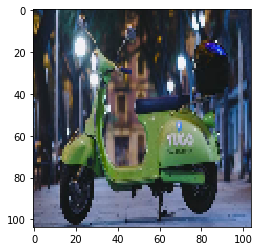

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


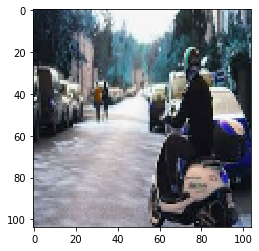

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


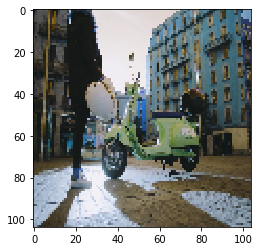

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


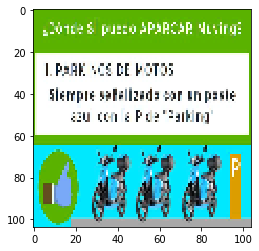

Valor real:
muving
Valor predecido:
blinkee
Imagen predecida erroneamente:


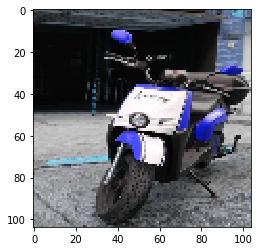

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


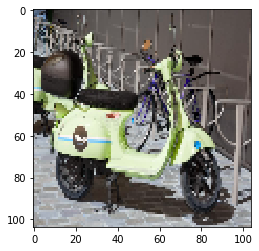

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


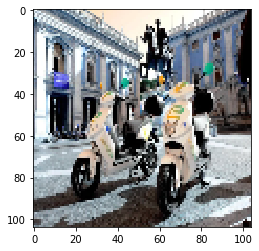

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


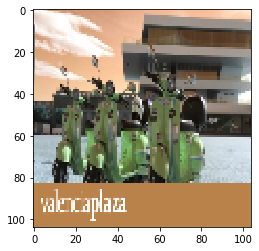

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


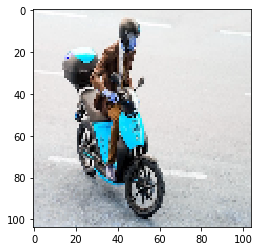

Valor real:
muving
Valor predecido:
eccoltra
Imagen predecida erroneamente:


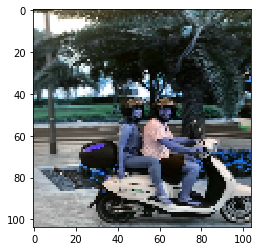

Valor real:
blinkee
Valor predecido:
muving
Imagen predecida erroneamente:


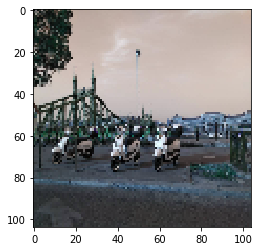

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


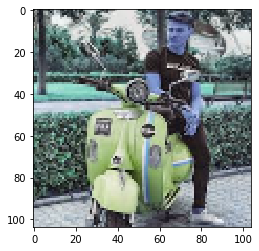

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


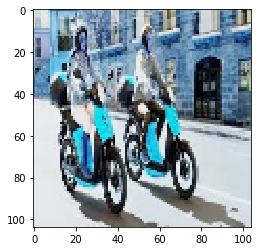

Valor real:
muving
Valor predecido:
motos
Imagen predecida erroneamente:


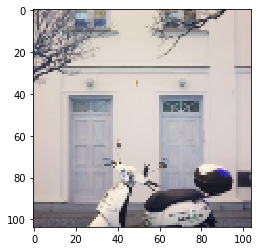

Valor real:
blinkee
Valor predecido:
eccoltra
Imagen predecida erroneamente:


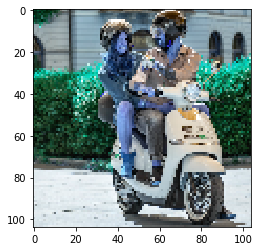

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


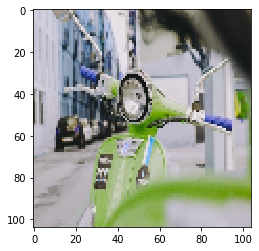

Valor real:
yego
Valor predecido:
eccoltra
Imagen predecida erroneamente:


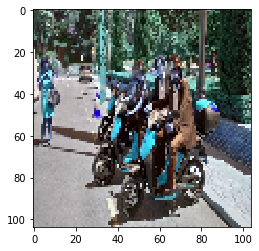

Valor real:
muving
Valor predecido:
motos
Imagen predecida erroneamente:


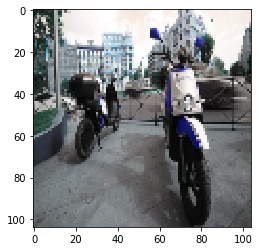

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


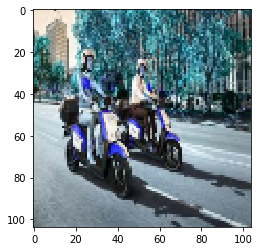

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


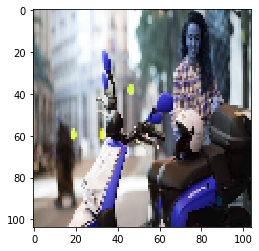

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


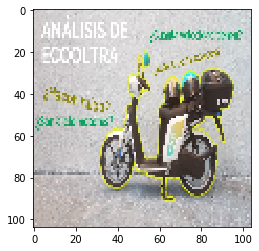

Valor real:
eccoltra
Valor predecido:
motos


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Data augmentation nivel bajo

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_Aug4_ub_complet   )

544/544 [==============================] - 8s 14ms/step
loss 7.145006348105038
acuracy 0.36580882352941174 
Imagen predecida erroneamente:


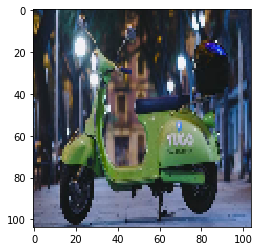

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


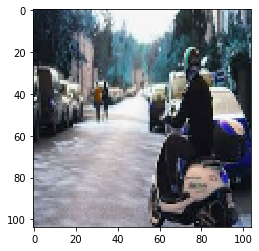

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


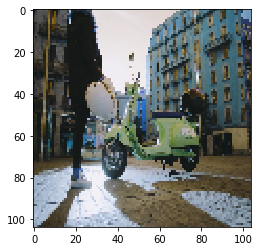

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


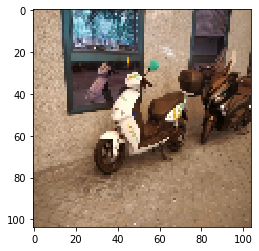

Valor real:
eccoltra
Valor predecido:
blinkee
Imagen predecida erroneamente:


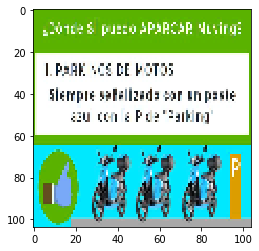

Valor real:
muving
Valor predecido:
blinkee
Imagen predecida erroneamente:


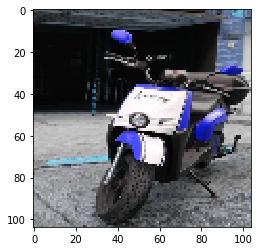

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


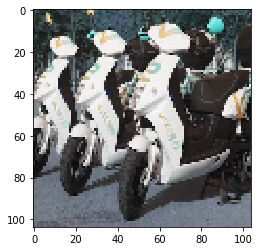

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


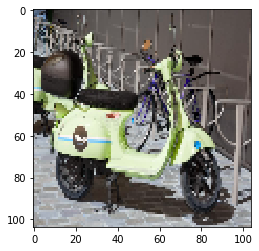

Valor real:
yego
Valor predecido:
eccoltra
Imagen predecida erroneamente:


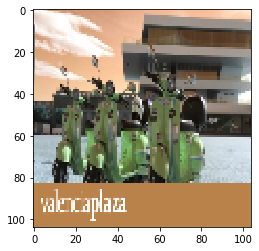

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


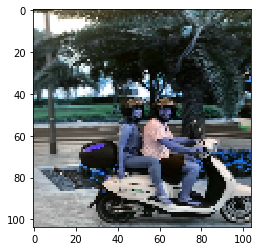

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


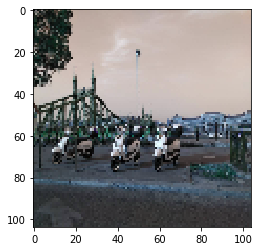

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


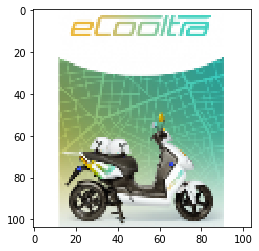

Valor real:
eccoltra
Valor predecido:
blinkee
Imagen predecida erroneamente:


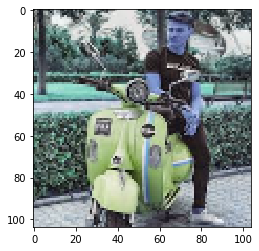

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


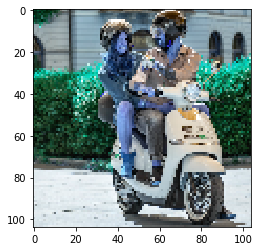

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


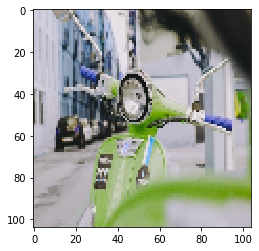

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


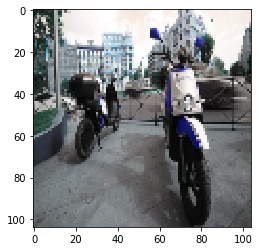

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


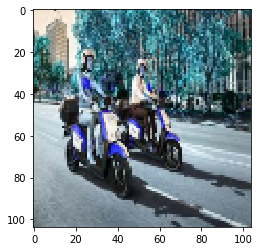

Valor real:
acciona
Valor predecido:
eccoltra
Imagen predecida erroneamente:


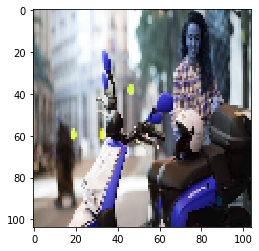

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


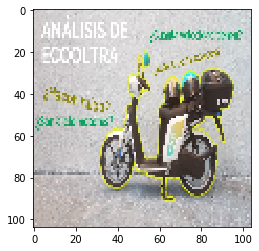

Valor real:
eccoltra
Valor predecido:
motos


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Data augmentation nivel medio

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_Aug6_ub_complet   )

544/544 [==============================] - 8s 14ms/step
loss 7.7748759494108315
acuracy 0.40808823529411764 
Imagen predecida erroneamente:


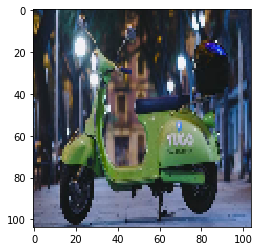

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


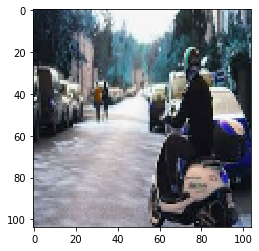

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


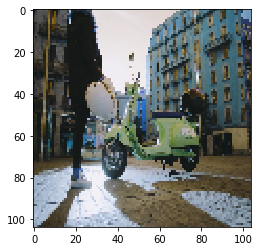

Valor real:
yego
Valor predecido:
eccoltra
Imagen predecida erroneamente:


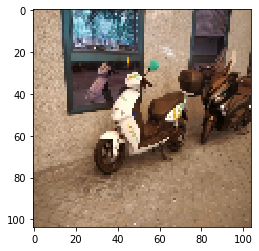

Valor real:
eccoltra
Valor predecido:
blinkee
Imagen predecida erroneamente:


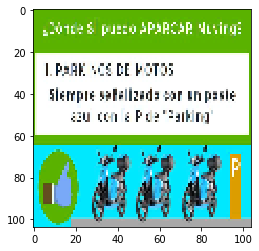

Valor real:
muving
Valor predecido:
blinkee
Imagen predecida erroneamente:


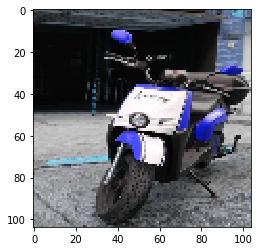

Valor real:
acciona
Valor predecido:
muving
Imagen predecida erroneamente:


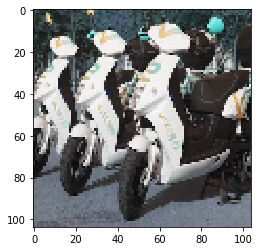

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


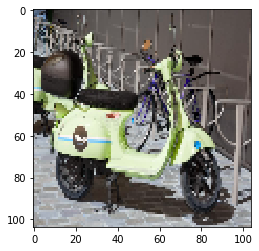

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


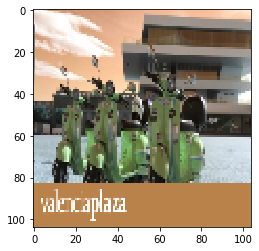

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


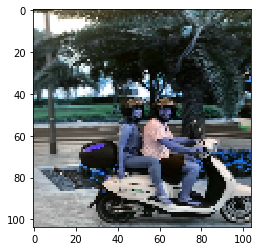

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


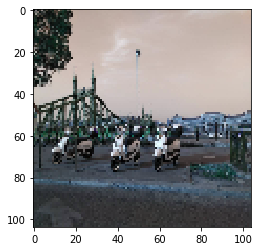

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


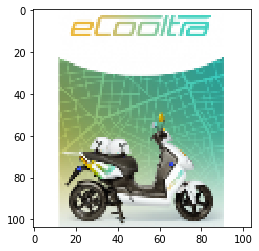

Valor real:
eccoltra
Valor predecido:
yego
Imagen predecida erroneamente:


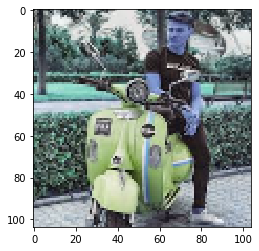

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


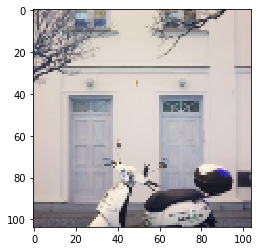

Valor real:
blinkee
Valor predecido:
muving
Imagen predecida erroneamente:


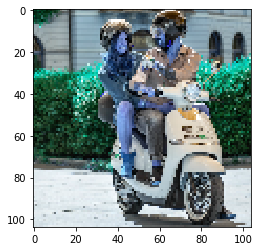

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


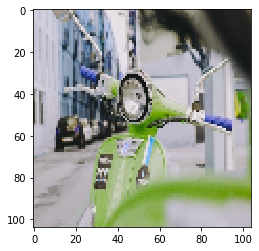

Valor real:
yego
Valor predecido:
blinkee
Imagen predecida erroneamente:


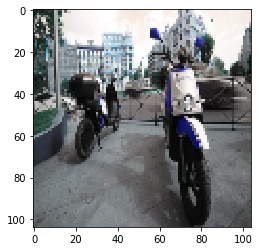

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


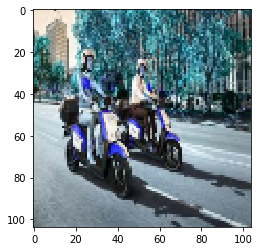

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


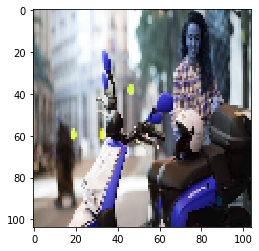

Valor real:
acciona
Valor predecido:
eccoltra


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Data augmentation nivel alto

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_AugMx_ub_complet   )

544/544 [==============================] - 8s 14ms/step
loss 3.5970263060401466
acuracy 0.1875 
Imagen predecida erroneamente:


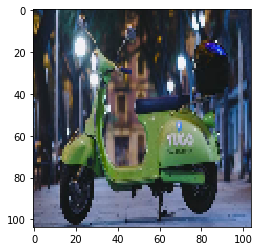

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


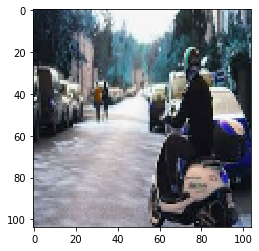

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


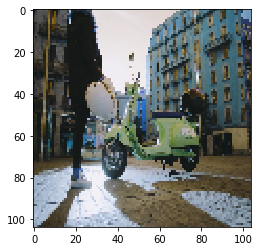

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


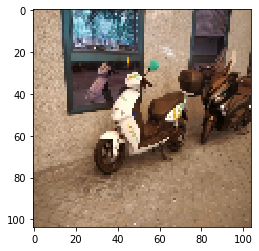

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


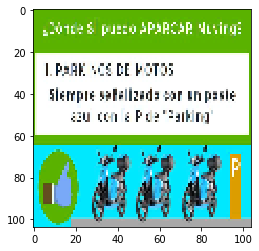

Valor real:
muving
Valor predecido:
motos
Imagen predecida erroneamente:


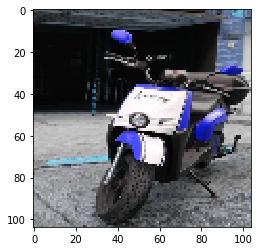

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


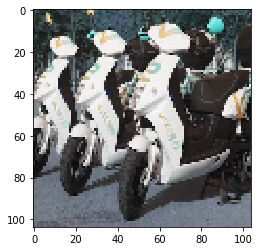

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


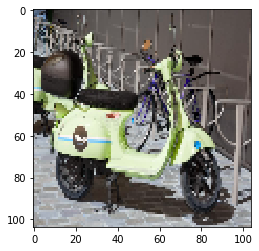

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


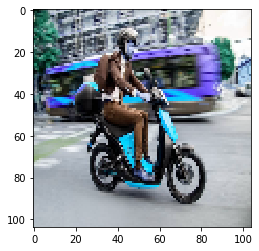

Valor real:
muving
Valor predecido:
motos
Imagen predecida erroneamente:


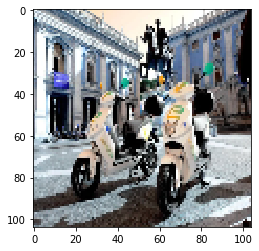

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


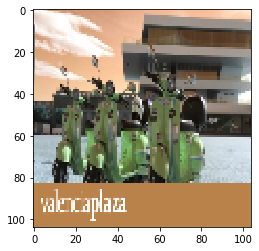

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


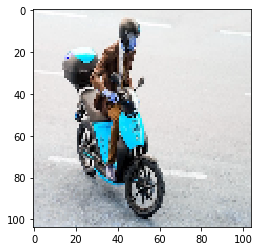

Valor real:
muving
Valor predecido:
motos
Imagen predecida erroneamente:


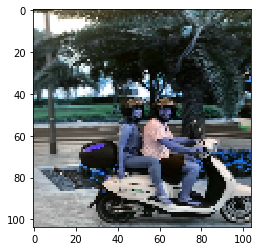

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


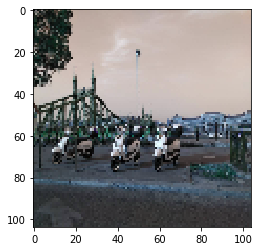

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


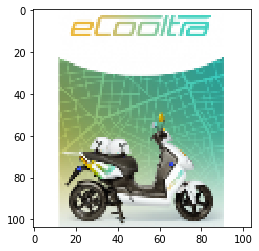

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


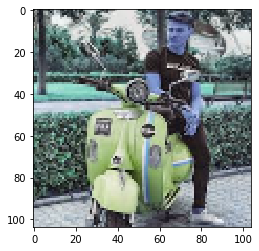

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


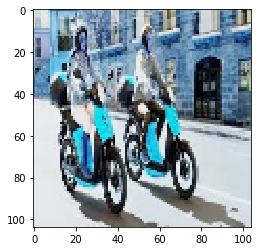

Valor real:
muving
Valor predecido:
motos
Imagen predecida erroneamente:


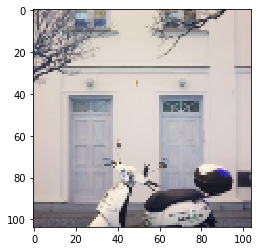

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


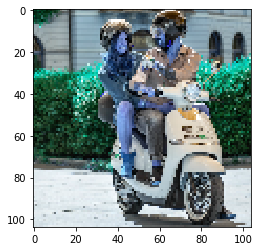

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


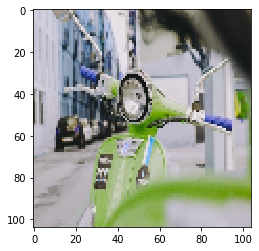

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


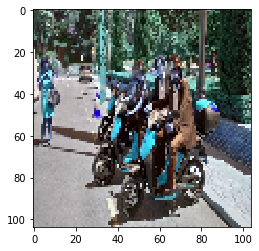

Valor real:
muving
Valor predecido:
motos
Imagen predecida erroneamente:


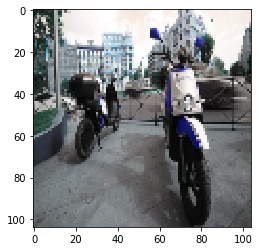

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


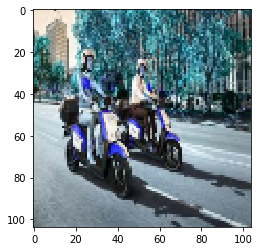

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


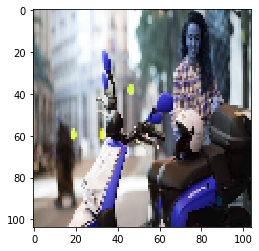

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


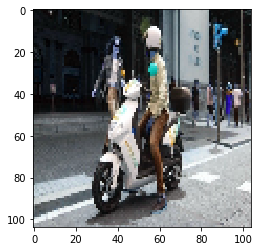

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


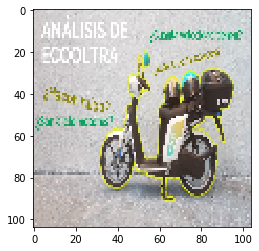

Valor real:
eccoltra
Valor predecido:
motos


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Datos balanceados nivel bajo

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_low_bal)

544/544 [==============================] - 8s 14ms/step
loss 5.429668987498564
acuracy 0.39705882352941174 
Imagen predecida erroneamente:


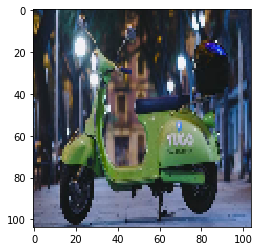

Valor real:
yego
Valor predecido:
eccoltra
Imagen predecida erroneamente:


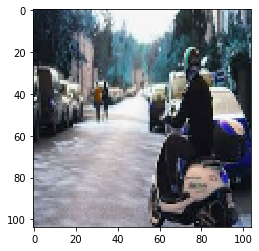

Valor real:
blinkee
Valor predecido:
eccoltra
Imagen predecida erroneamente:


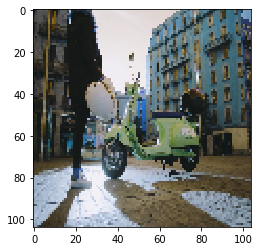

Valor real:
yego
Valor predecido:
acciona
Imagen predecida erroneamente:


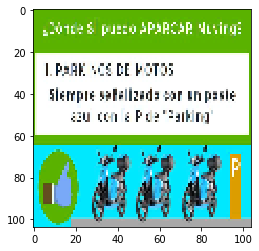

Valor real:
muving
Valor predecido:
blinkee
Imagen predecida erroneamente:


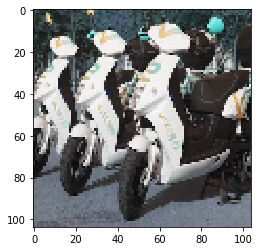

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


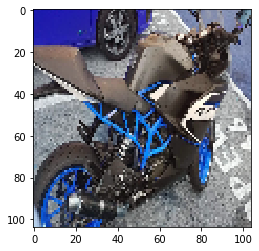

Valor real:
motos
Valor predecido:
muving
Imagen predecida erroneamente:


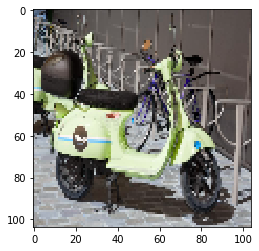

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


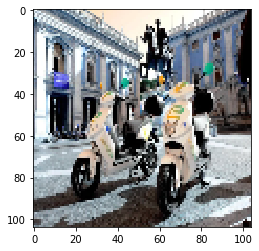

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


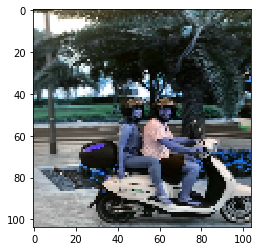

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


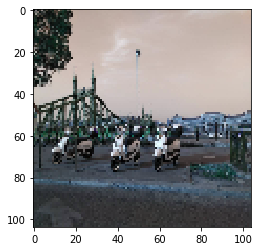

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


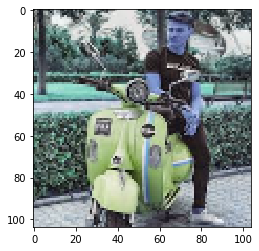

Valor real:
yego
Valor predecido:
acciona
Imagen predecida erroneamente:


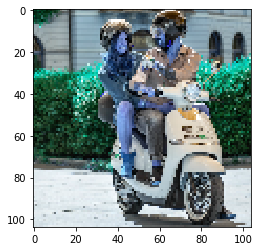

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


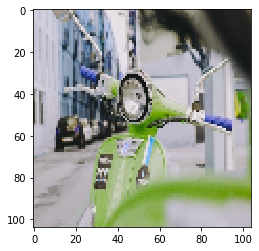

Valor real:
yego
Valor predecido:
eccoltra
Imagen predecida erroneamente:


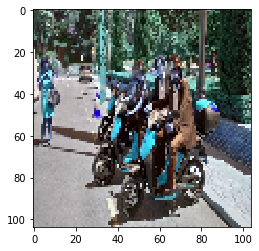

Valor real:
muving
Valor predecido:
acciona
Imagen predecida erroneamente:


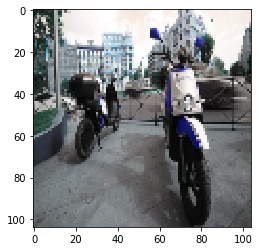

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


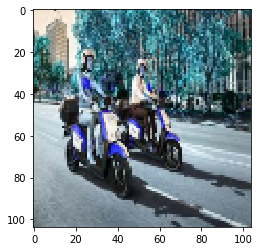

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


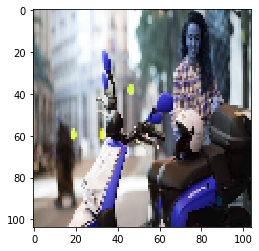

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


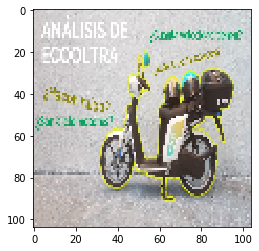

Valor real:
eccoltra
Valor predecido:
motos


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Datos balanceados nivel medio

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_medium_bal )

544/544 [==============================] - 8s 14ms/step
loss 5.766714068020091
acuracy 0.43933823529411764 
Imagen predecida erroneamente:


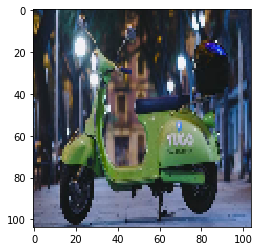

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


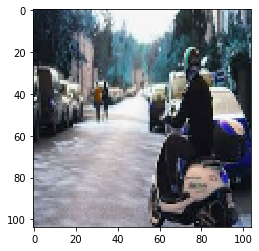

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


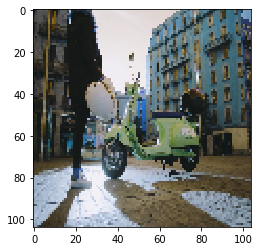

Valor real:
yego
Valor predecido:
acciona
Imagen predecida erroneamente:


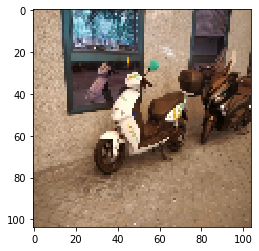

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


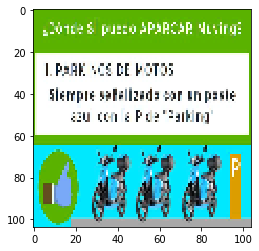

Valor real:
muving
Valor predecido:
blinkee
Imagen predecida erroneamente:


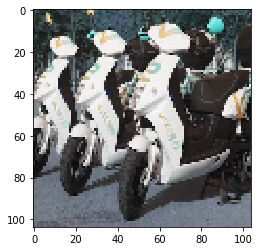

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


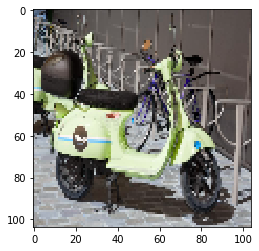

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


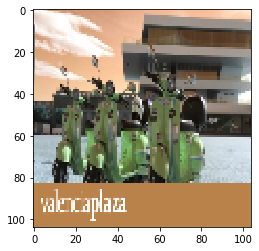

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


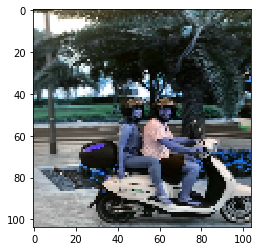

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


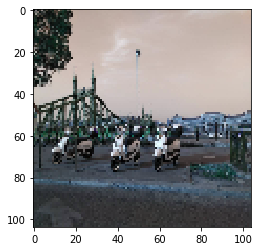

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


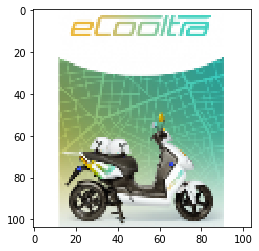

Valor real:
eccoltra
Valor predecido:
muving
Imagen predecida erroneamente:


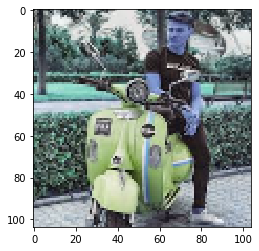

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


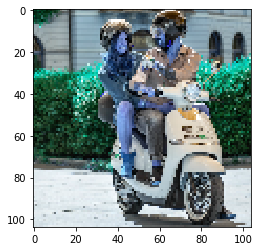

Valor real:
blinkee
Valor predecido:
muving
Imagen predecida erroneamente:


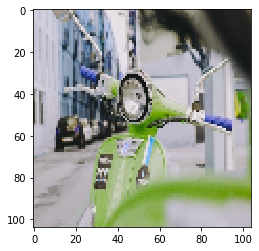

Valor real:
yego
Valor predecido:
blinkee
Imagen predecida erroneamente:


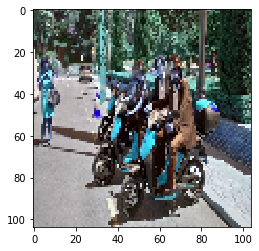

Valor real:
muving
Valor predecido:
acciona
Imagen predecida erroneamente:


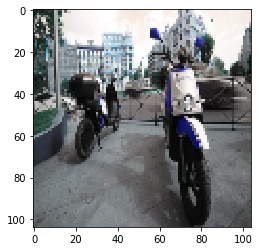

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


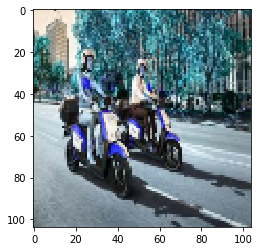

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


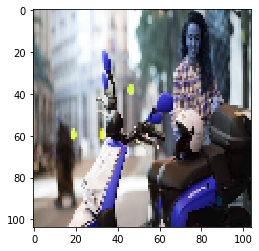

Valor real:
acciona
Valor predecido:
motos


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Datos balanceados nivel alto

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_high_bal  )

544/544 [==============================] - 8s 14ms/step
loss 6.360645686878877
acuracy 0.40808823529411764 
Imagen predecida erroneamente:


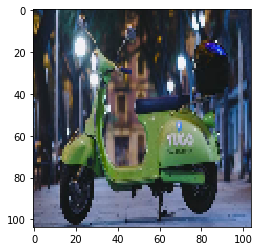

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


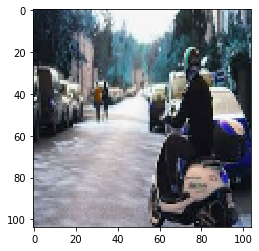

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


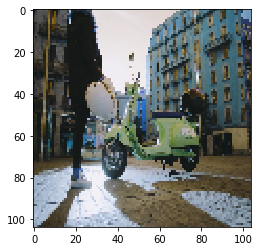

Valor real:
yego
Valor predecido:
eccoltra
Imagen predecida erroneamente:


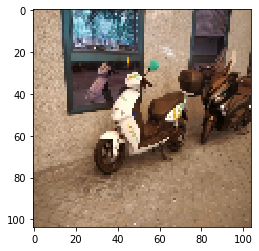

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


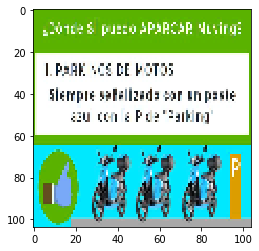

Valor real:
muving
Valor predecido:
eccoltra
Imagen predecida erroneamente:


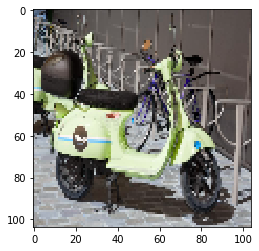

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


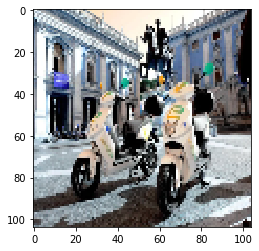

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


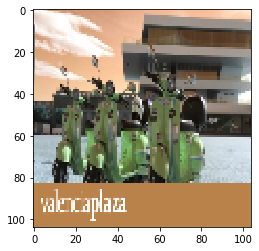

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


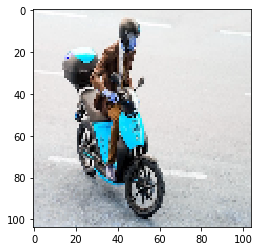

Valor real:
muving
Valor predecido:
eccoltra
Imagen predecida erroneamente:


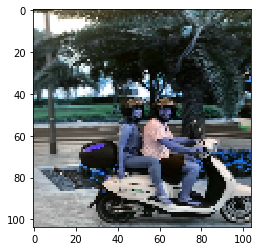

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


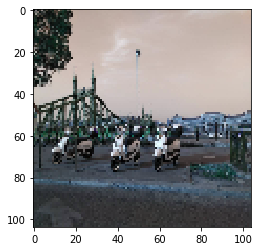

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


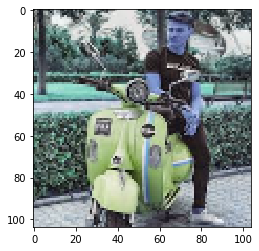

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


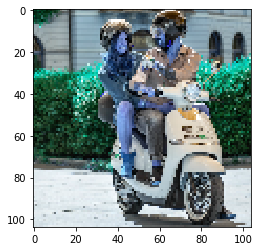

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


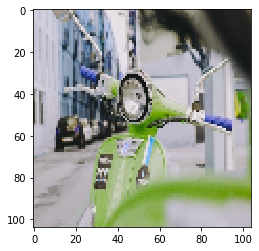

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


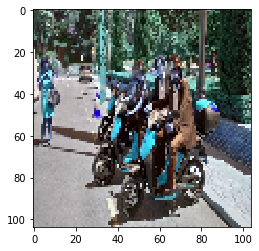

Valor real:
muving
Valor predecido:
motos
Imagen predecida erroneamente:


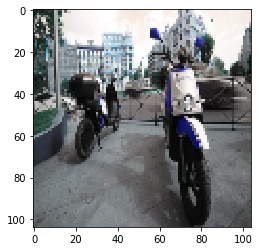

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


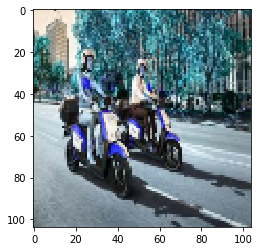

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


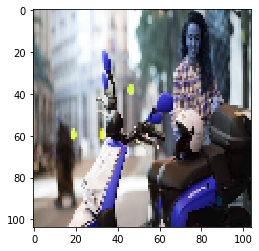

Valor real:
acciona
Valor predecido:
motos


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

### Modelos entrenados con YOLOv3

In [0]:
base_datos_nombre = YOLOv3

#### No data augmentation

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_std_ub_complet  )

544/544 [==============================] - 8s 14ms/step
loss 3.259867920595057
acuracy 0.41544117647058826 
Imagen predecida erroneamente:


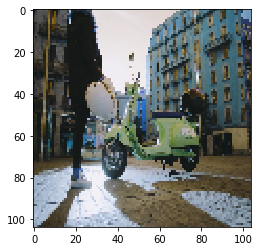

Valor real:
yego
Valor predecido:
blinkee
Imagen predecida erroneamente:


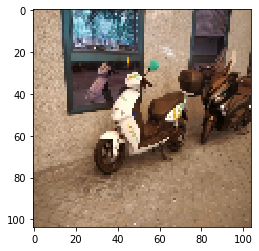

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


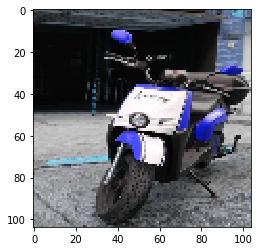

Valor real:
acciona
Valor predecido:
eccoltra
Imagen predecida erroneamente:


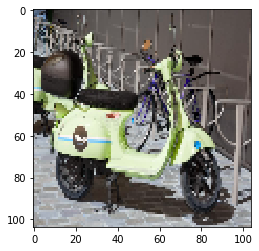

Valor real:
yego
Valor predecido:
blinkee
Imagen predecida erroneamente:


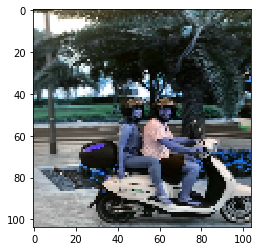

Valor real:
blinkee
Valor predecido:
eccoltra
Imagen predecida erroneamente:


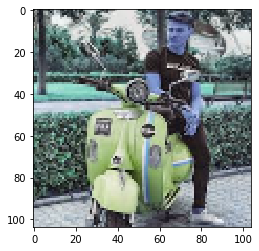

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


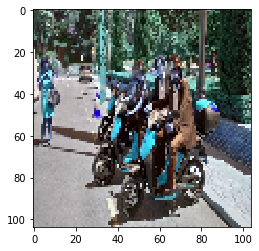

Valor real:
muving
Valor predecido:
motos
Imagen predecida erroneamente:


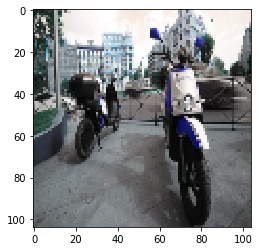

Valor real:
acciona
Valor predecido:
blinkee
Imagen predecida erroneamente:


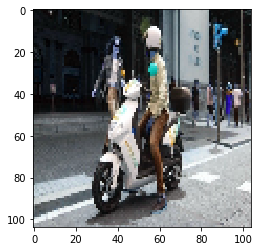

Valor real:
eccoltra
Valor predecido:
blinkee
Imagen predecida erroneamente:


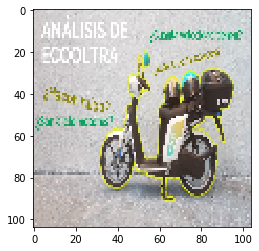

Valor real:
eccoltra
Valor predecido:
blinkee


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Data augmentation nivel bajo

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_Aug4_ub_complet   )

544/544 [==============================] - 8s 15ms/step
loss 1.988862493458916
acuracy 0.6286764705882353 
Imagen predecida erroneamente:


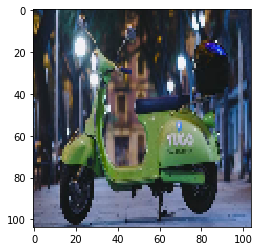

Valor real:
yego
Valor predecido:
blinkee
Imagen predecida erroneamente:


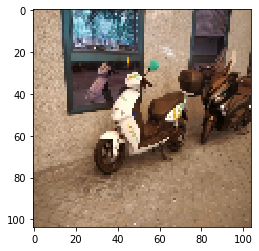

Valor real:
eccoltra
Valor predecido:
blinkee
Imagen predecida erroneamente:


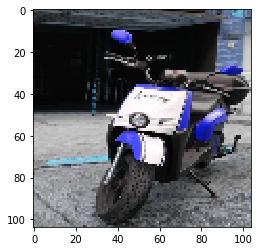

Valor real:
acciona
Valor predecido:
muving
Imagen predecida erroneamente:


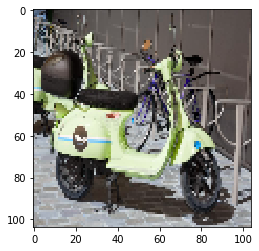

Valor real:
yego
Valor predecido:
blinkee
Imagen predecida erroneamente:


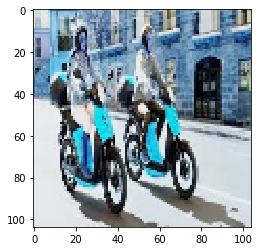

Valor real:
muving
Valor predecido:
eccoltra
Imagen predecida erroneamente:


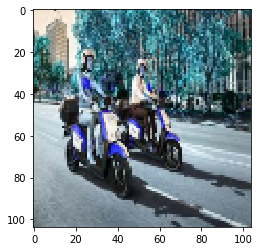

Valor real:
acciona
Valor predecido:
motos


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Data augmentation nivel medio

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_Aug6_ub_complet   )

544/544 [==============================] - 8s 15ms/step
loss 1.6086941291304195
acuracy 0.7205882352941176 
Imagen predecida erroneamente:


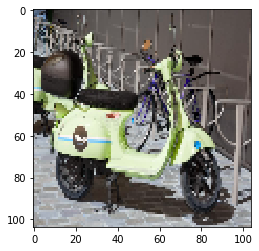

Valor real:
yego
Valor predecido:
eccoltra
Imagen predecida erroneamente:


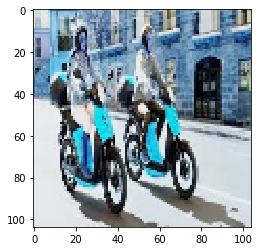

Valor real:
muving
Valor predecido:
eccoltra
Imagen predecida erroneamente:


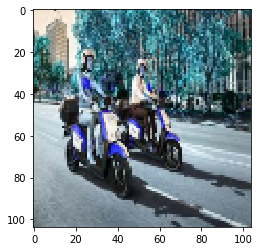

Valor real:
acciona
Valor predecido:
muving


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Data augmentation nivel alto

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_AugMx_ub_complet   )

544/544 [==============================] - 8s 15ms/step
loss 0.9083582978038227
acuracy 0.8694852941176471 
Imagen predecida erroneamente:


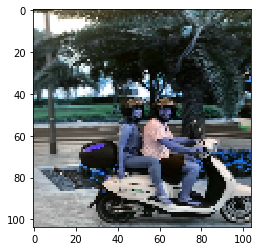

Valor real:
blinkee
Valor predecido:
muving
Imagen predecida erroneamente:


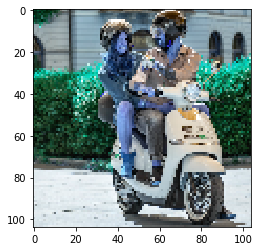

Valor real:
blinkee
Valor predecido:
eccoltra


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Datos balanceados nivel bajo

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_low_bal)

544/544 [==============================] - 8s 15ms/step
loss 2.45947107146768
acuracy 0.6397058823529411 
Imagen predecida erroneamente:


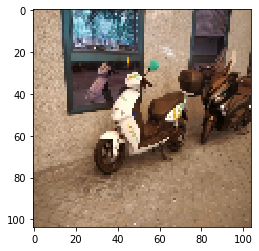

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


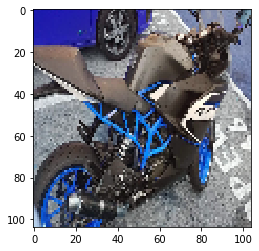

Valor real:
motos
Valor predecido:
muving
Imagen predecida erroneamente:


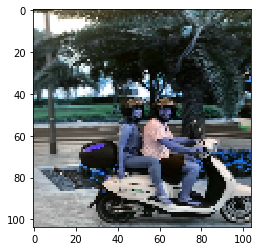

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


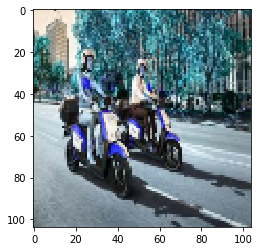

Valor real:
acciona
Valor predecido:
blinkee


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Datos balanceados nivel medio

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_medium_bal )

544/544 [==============================] - 8s 15ms/step
loss 2.1749447443906
acuracy 0.71875 
Imagen predecida erroneamente:


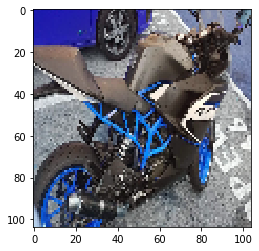

Valor real:
motos
Valor predecido:
muving
Imagen predecida erroneamente:


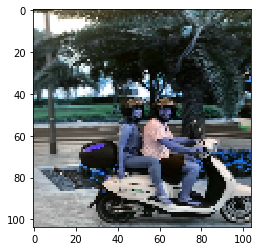

Valor real:
blinkee
Valor predecido:
acciona
Imagen predecida erroneamente:


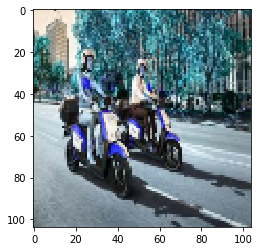

Valor real:
acciona
Valor predecido:
blinkee
Imagen predecida erroneamente:


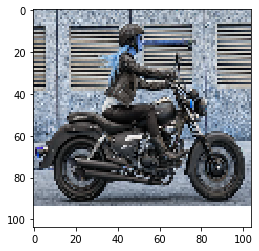

Valor real:
motos
Valor predecido:
eccoltra


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Datos balanceados nivel alto

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_high_bal  )

544/544 [==============================] - 8s 15ms/step
loss 1.468483500620898
acuracy 0.7371323529411765 
Imagen predecida erroneamente:


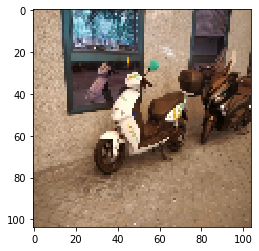

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


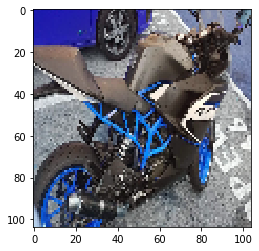

Valor real:
motos
Valor predecido:
muving
Imagen predecida erroneamente:


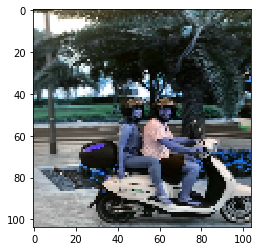

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


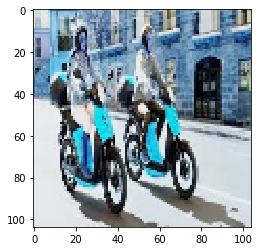

Valor real:
muving
Valor predecido:
eccoltra
Imagen predecida erroneamente:


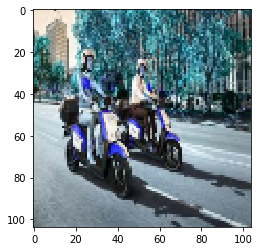

Valor real:
acciona
Valor predecido:
blinkee


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

### Modelos entrenados base de datos manual

In [0]:
base_datos_nombre = manual

#### No data augmentation

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_std_ub_complet  )

544/544 [==============================] - 8s 15ms/step
loss 4.235754868563483
acuracy 0.3602941176470588 
Imagen predecida erroneamente:


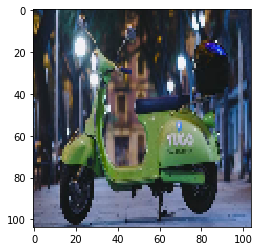

Valor real:
yego
Valor predecido:
eccoltra
Imagen predecida erroneamente:


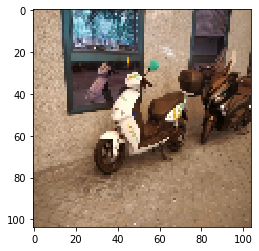

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


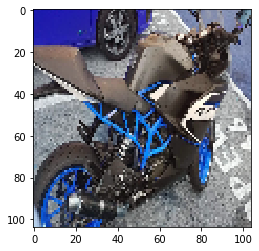

Valor real:
motos
Valor predecido:
muving
Imagen predecida erroneamente:


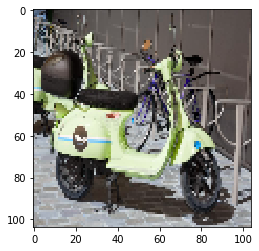

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


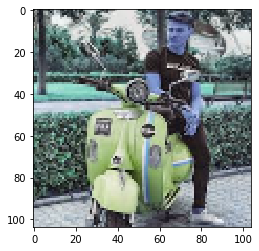

Valor real:
yego
Valor predecido:
blinkee
Imagen predecida erroneamente:


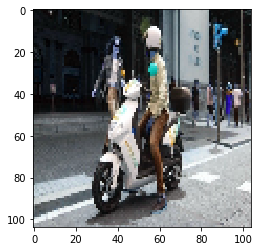

Valor real:
eccoltra
Valor predecido:
muving
Imagen predecida erroneamente:


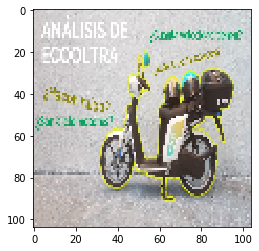

Valor real:
eccoltra
Valor predecido:
motos


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Data augmentation nivel bajo

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_Aug4_ub_complet   )

544/544 [==============================] - 8s 15ms/step
loss 2.319163392571842
acuracy 0.6378676470588235 
Imagen predecida erroneamente:


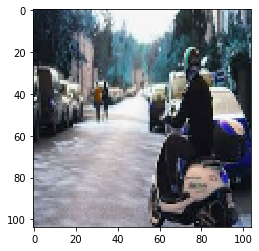

Valor real:
blinkee
Valor predecido:
eccoltra
Imagen predecida erroneamente:


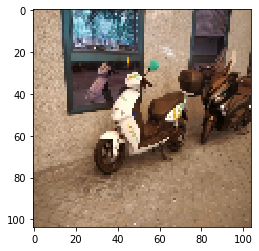

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


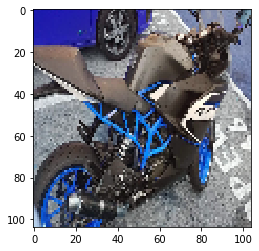

Valor real:
motos
Valor predecido:
muving
Imagen predecida erroneamente:


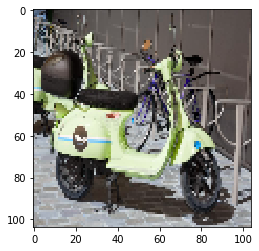

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


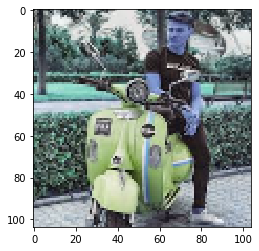

Valor real:
yego
Valor predecido:
blinkee
Imagen predecida erroneamente:


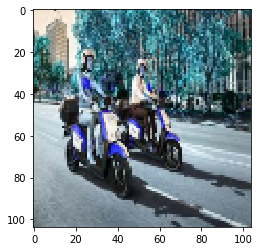

Valor real:
acciona
Valor predecido:
blinkee
Imagen predecida erroneamente:


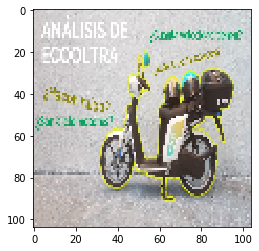

Valor real:
eccoltra
Valor predecido:
motos


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Data augmentation nivel medio

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_Aug6_ub_complet   )

544/544 [==============================] - 8s 15ms/step
loss 0.9500379001393038
acuracy 0.8290441176470589 
Imagen predecida erroneamente:


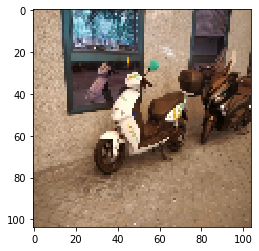

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


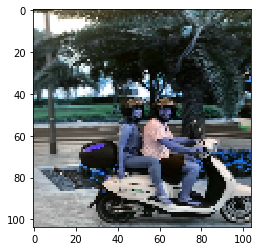

Valor real:
blinkee
Valor predecido:
acciona
Imagen predecida erroneamente:


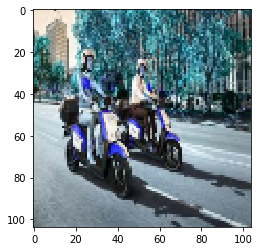

Valor real:
acciona
Valor predecido:
muving


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Data augmentation nivel alto

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_AugMx_ub_complet   )

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

544/544 [==============================] - 8s 15ms/step
loss 0.4031899957095875
acuracy 0.9411764705882353 


True

#### Datos balanceados nivel bajo

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_low_bal)

544/544 [==============================] - 8s 15ms/step
loss 2.343747580752653
acuracy 0.6011029411764706 
Imagen predecida erroneamente:


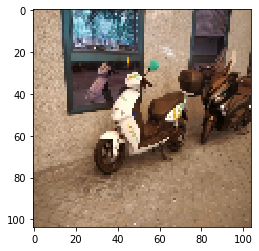

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


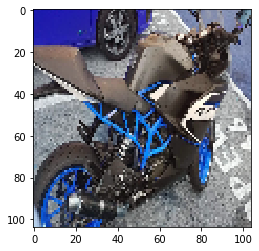

Valor real:
motos
Valor predecido:
acciona
Imagen predecida erroneamente:


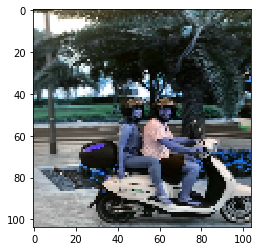

Valor real:
blinkee
Valor predecido:
acciona
Imagen predecida erroneamente:


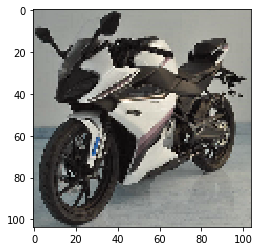

Valor real:
motos
Valor predecido:
eccoltra
Imagen predecida erroneamente:


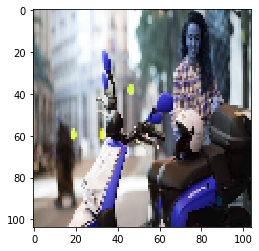

Valor real:
acciona
Valor predecido:
eccoltra
Imagen predecida erroneamente:


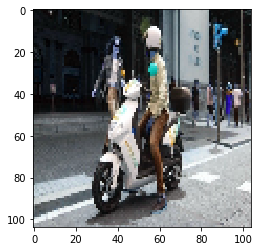

Valor real:
eccoltra
Valor predecido:
blinkee


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Datos balanceados nivel medio

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_medium_bal )

544/544 [==============================] - 8s 15ms/step
loss 2.2879357793751884
acuracy 0.6764705882352942 
Imagen predecida erroneamente:


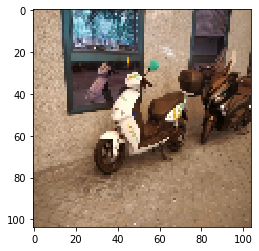

Valor real:
eccoltra
Valor predecido:
blinkee
Imagen predecida erroneamente:


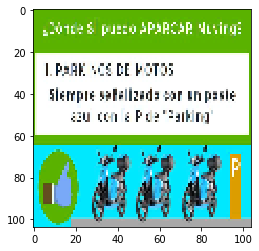

Valor real:
muving
Valor predecido:
yego
Imagen predecida erroneamente:


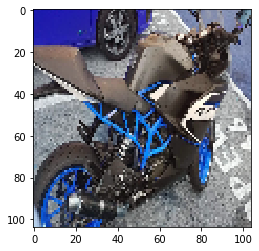

Valor real:
motos
Valor predecido:
muving
Imagen predecida erroneamente:


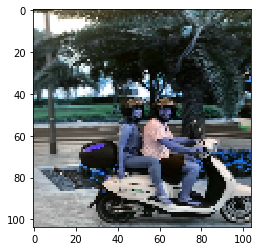

Valor real:
blinkee
Valor predecido:
acciona


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Datos balanceados nivel alto

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_high_bal  )

544/544 [==============================] - 8s 15ms/step
loss 1.0967245785629047
acuracy 0.8125 
Imagen predecida erroneamente:


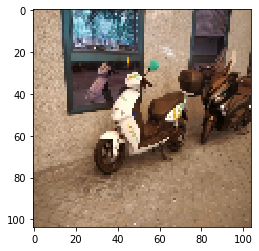

Valor real:
eccoltra
Valor predecido:
blinkee
Imagen predecida erroneamente:


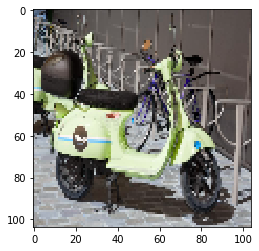

Valor real:
yego
Valor predecido:
blinkee


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

### Modelos entrenados base de datos sin filtrar

In [0]:
base_datos_nombre = nofil

#### No data augmentation

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_std_ub_complet  )

544/544 [==============================] - 8s 16ms/step
loss 2.136882957290201
acuracy 0.1875 
Imagen predecida erroneamente:


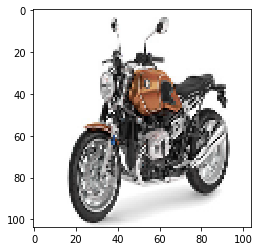

Valor real:
motos
Valor predecido:
eccoltra
Imagen predecida erroneamente:


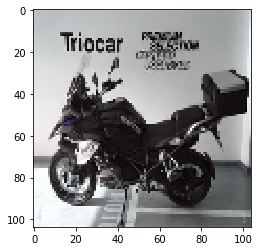

Valor real:
motos
Valor predecido:
eccoltra
Imagen predecida erroneamente:


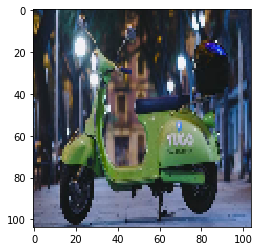

Valor real:
yego
Valor predecido:
eccoltra
Imagen predecida erroneamente:


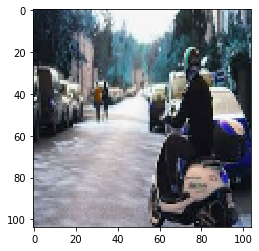

Valor real:
blinkee
Valor predecido:
eccoltra
Imagen predecida erroneamente:


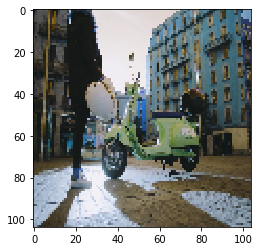

Valor real:
yego
Valor predecido:
eccoltra
Imagen predecida erroneamente:


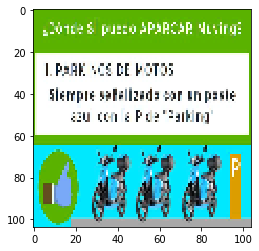

Valor real:
muving
Valor predecido:
eccoltra
Imagen predecida erroneamente:


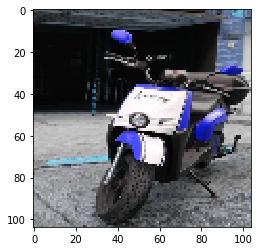

Valor real:
acciona
Valor predecido:
eccoltra
Imagen predecida erroneamente:


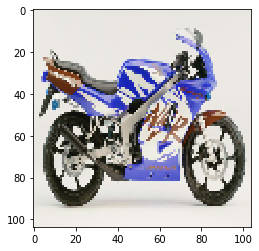

Valor real:
motos
Valor predecido:
eccoltra
Imagen predecida erroneamente:


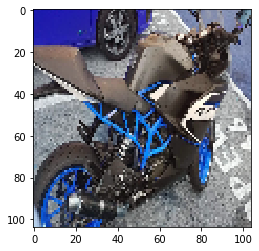

Valor real:
motos
Valor predecido:
eccoltra
Imagen predecida erroneamente:


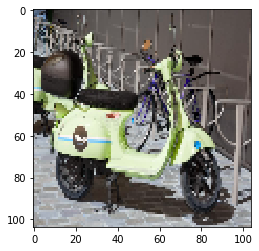

Valor real:
yego
Valor predecido:
eccoltra
Imagen predecida erroneamente:


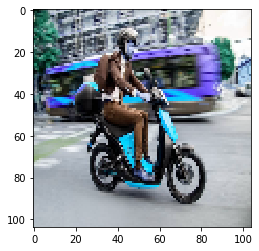

Valor real:
muving
Valor predecido:
eccoltra
Imagen predecida erroneamente:


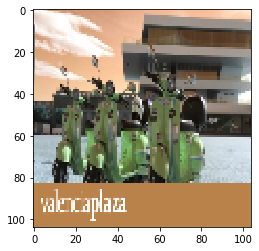

Valor real:
yego
Valor predecido:
eccoltra
Imagen predecida erroneamente:


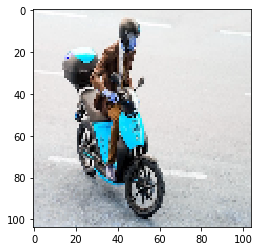

Valor real:
muving
Valor predecido:
eccoltra
Imagen predecida erroneamente:


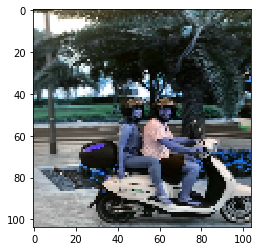

Valor real:
blinkee
Valor predecido:
eccoltra
Imagen predecida erroneamente:


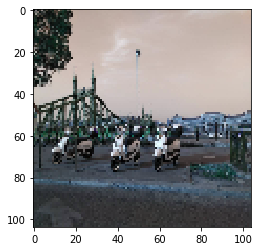

Valor real:
blinkee
Valor predecido:
eccoltra
Imagen predecida erroneamente:


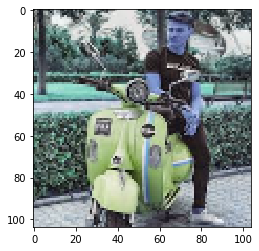

Valor real:
yego
Valor predecido:
eccoltra
Imagen predecida erroneamente:


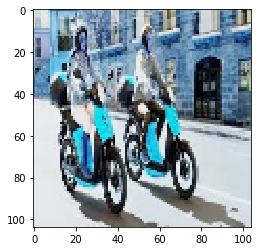

Valor real:
muving
Valor predecido:
eccoltra
Imagen predecida erroneamente:


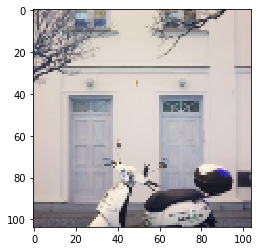

Valor real:
blinkee
Valor predecido:
eccoltra
Imagen predecida erroneamente:


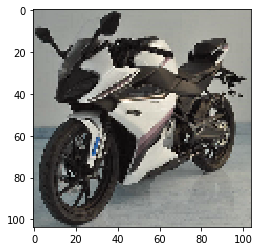

Valor real:
motos
Valor predecido:
eccoltra
Imagen predecida erroneamente:


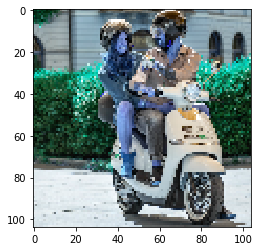

Valor real:
blinkee
Valor predecido:
eccoltra
Imagen predecida erroneamente:


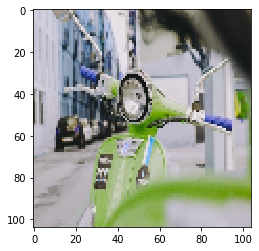

Valor real:
yego
Valor predecido:
eccoltra
Imagen predecida erroneamente:


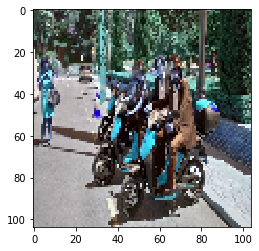

Valor real:
muving
Valor predecido:
eccoltra
Imagen predecida erroneamente:


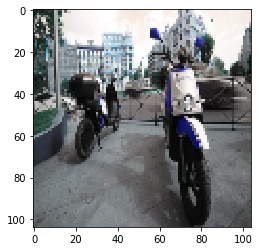

Valor real:
acciona
Valor predecido:
eccoltra
Imagen predecida erroneamente:


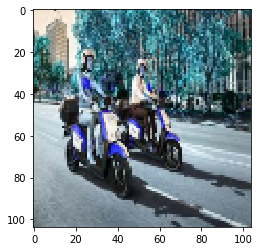

Valor real:
acciona
Valor predecido:
eccoltra
Imagen predecida erroneamente:


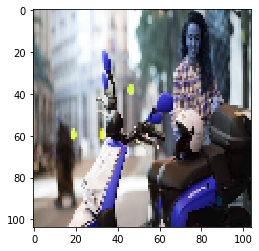

Valor real:
acciona
Valor predecido:
eccoltra
Imagen predecida erroneamente:


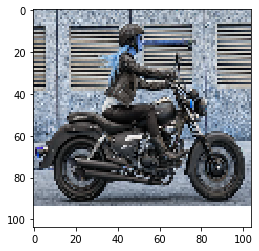

Valor real:
motos
Valor predecido:
eccoltra


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Data augmentation nivel bajo

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_Aug4_ub_complet   )

544/544 [==============================] - 9s 16ms/step
loss 1.8433140025419348
acuracy 0.5827205882352942 
Imagen predecida erroneamente:


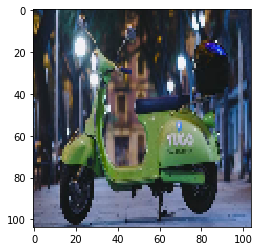

Valor real:
yego
Valor predecido:
eccoltra
Imagen predecida erroneamente:


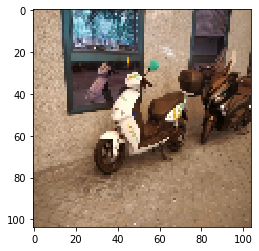

Valor real:
eccoltra
Valor predecido:
yego
Imagen predecida erroneamente:


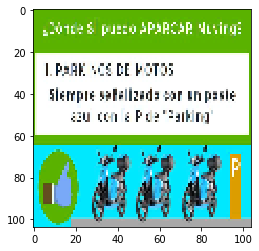

Valor real:
muving
Valor predecido:
yego
Imagen predecida erroneamente:


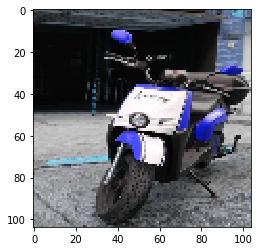

Valor real:
acciona
Valor predecido:
muving
Imagen predecida erroneamente:


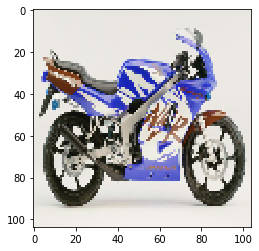

Valor real:
motos
Valor predecido:
acciona
Imagen predecida erroneamente:


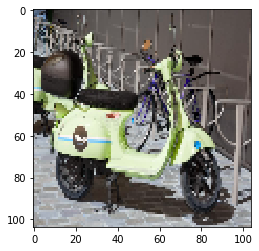

Valor real:
yego
Valor predecido:
blinkee
Imagen predecida erroneamente:


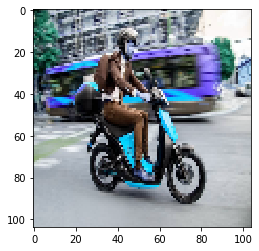

Valor real:
muving
Valor predecido:
eccoltra
Imagen predecida erroneamente:


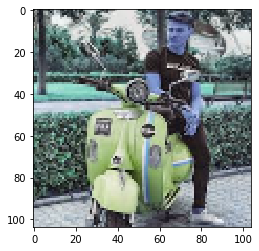

Valor real:
yego
Valor predecido:
blinkee
Imagen predecida erroneamente:


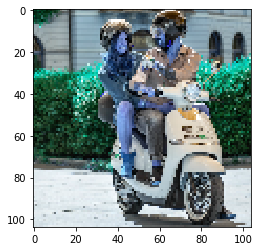

Valor real:
blinkee
Valor predecido:
acciona
Imagen predecida erroneamente:


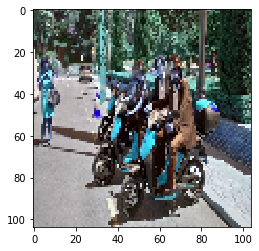

Valor real:
muving
Valor predecido:
motos
Imagen predecida erroneamente:


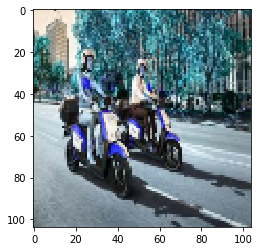

Valor real:
acciona
Valor predecido:
yego


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Data augmentation nivel medio

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_Aug6_ub_complet   )

544/544 [==============================] - 9s 16ms/step
loss 1.8963924155515783
acuracy 0.1875 
Imagen predecida erroneamente:


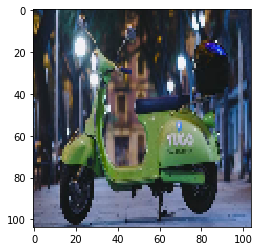

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


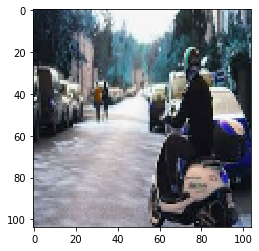

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


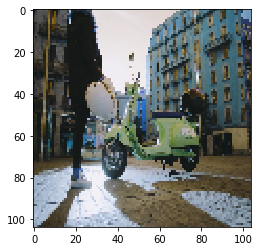

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


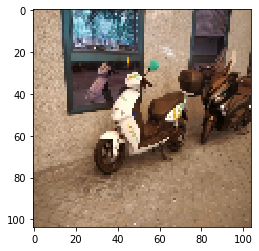

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


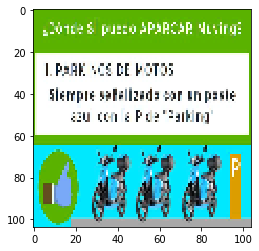

Valor real:
muving
Valor predecido:
motos
Imagen predecida erroneamente:


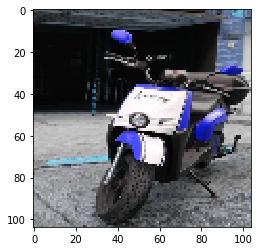

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


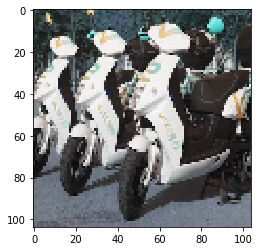

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


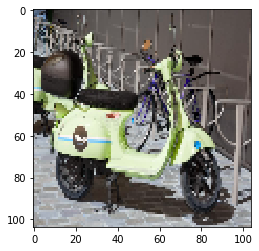

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


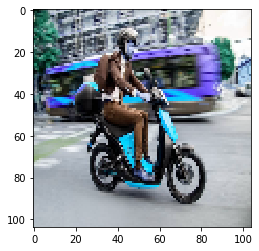

Valor real:
muving
Valor predecido:
motos
Imagen predecida erroneamente:


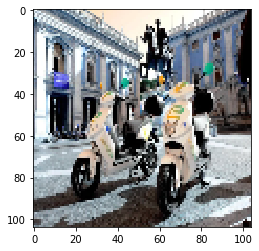

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


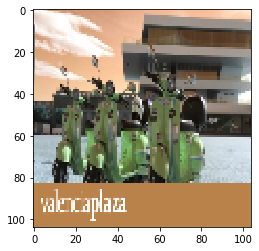

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


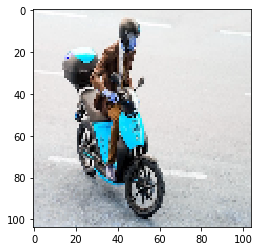

Valor real:
muving
Valor predecido:
motos
Imagen predecida erroneamente:


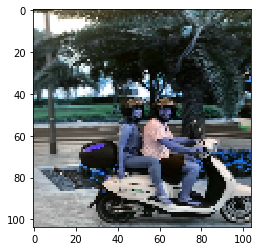

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


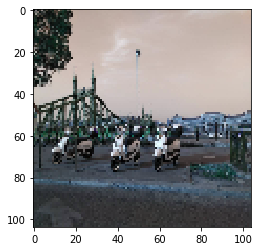

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


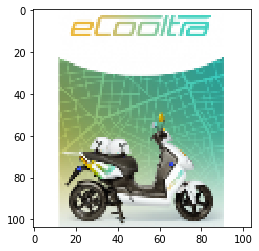

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


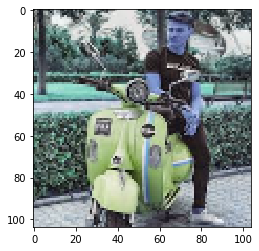

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


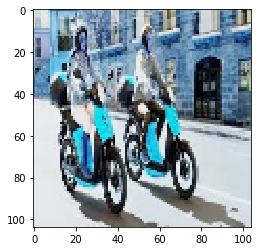

Valor real:
muving
Valor predecido:
motos
Imagen predecida erroneamente:


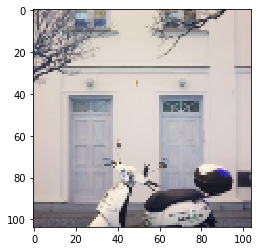

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


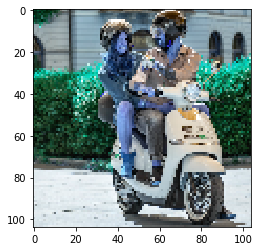

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


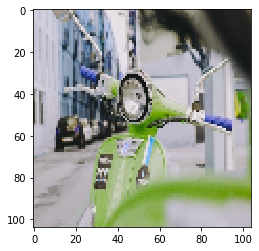

Valor real:
yego
Valor predecido:
motos
Imagen predecida erroneamente:


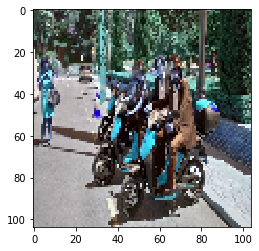

Valor real:
muving
Valor predecido:
motos
Imagen predecida erroneamente:


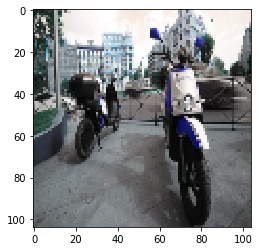

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


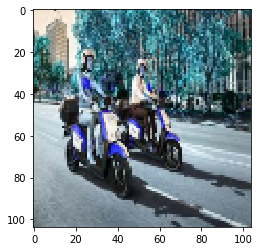

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


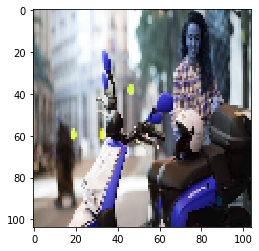

Valor real:
acciona
Valor predecido:
motos
Imagen predecida erroneamente:


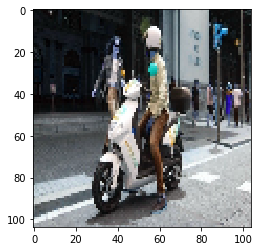

Valor real:
eccoltra
Valor predecido:
motos
Imagen predecida erroneamente:


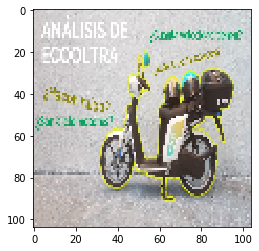

Valor real:
eccoltra
Valor predecido:
motos


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Datos balanceados nivel bajo

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_low_bal)

544/544 [==============================] - 9s 16ms/step
loss 4.549041944391587
acuracy 0.2757352941176471 
Imagen predecida erroneamente:


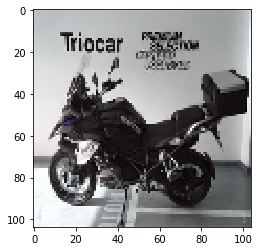

Valor real:
motos
Valor predecido:
acciona
Imagen predecida erroneamente:


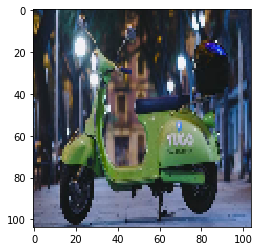

Valor real:
yego
Valor predecido:
eccoltra
Imagen predecida erroneamente:


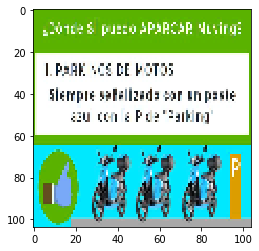

Valor real:
muving
Valor predecido:
yego
Imagen predecida erroneamente:


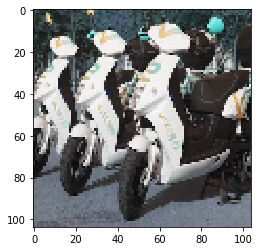

Valor real:
eccoltra
Valor predecido:
blinkee
Imagen predecida erroneamente:


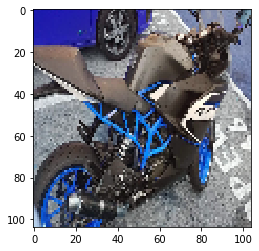

Valor real:
motos
Valor predecido:
acciona
Imagen predecida erroneamente:


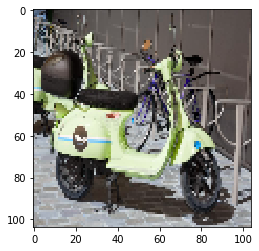

Valor real:
yego
Valor predecido:
blinkee
Imagen predecida erroneamente:


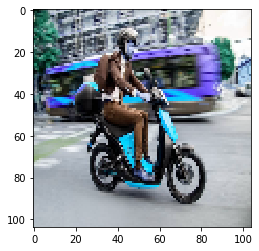

Valor real:
muving
Valor predecido:
eccoltra
Imagen predecida erroneamente:


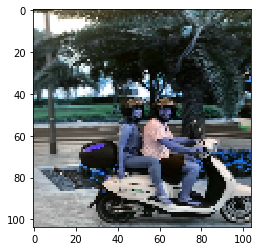

Valor real:
blinkee
Valor predecido:
motos
Imagen predecida erroneamente:


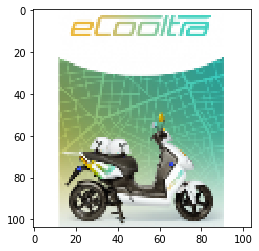

Valor real:
eccoltra
Valor predecido:
muving
Imagen predecida erroneamente:


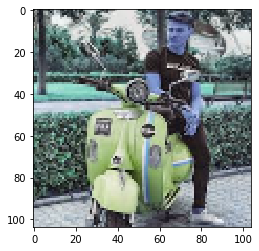

Valor real:
yego
Valor predecido:
blinkee
Imagen predecida erroneamente:


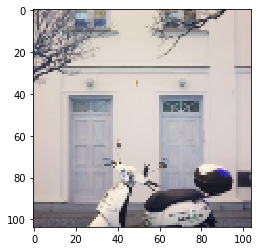

Valor real:
blinkee
Valor predecido:
acciona
Imagen predecida erroneamente:


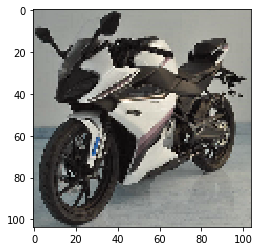

Valor real:
motos
Valor predecido:
blinkee
Imagen predecida erroneamente:


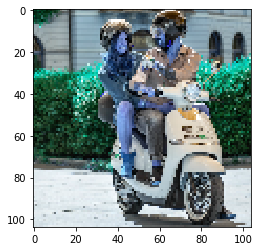

Valor real:
blinkee
Valor predecido:
acciona
Imagen predecida erroneamente:


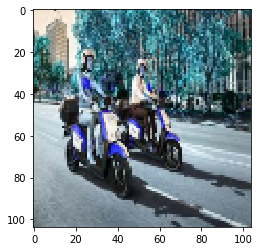

Valor real:
acciona
Valor predecido:
blinkee
Imagen predecida erroneamente:


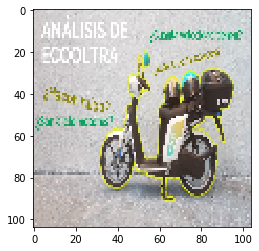

Valor real:
eccoltra
Valor predecido:
yego


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Datos balanceados nivel medio

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_medium_bal )

544/544 [==============================] - 9s 16ms/step
loss 4.076434051289278
acuracy 0.3290441176470588 
Imagen predecida erroneamente:


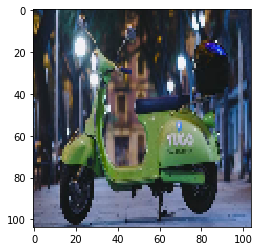

Valor real:
yego
Valor predecido:
blinkee
Imagen predecida erroneamente:


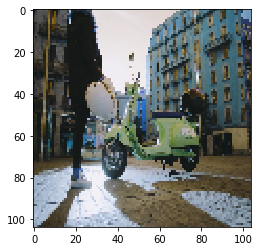

Valor real:
yego
Valor predecido:
blinkee
Imagen predecida erroneamente:


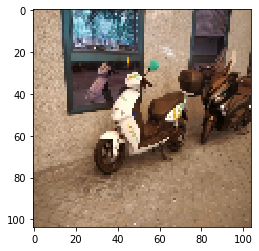

Valor real:
eccoltra
Valor predecido:
yego
Imagen predecida erroneamente:


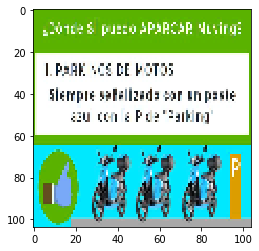

Valor real:
muving
Valor predecido:
acciona
Imagen predecida erroneamente:


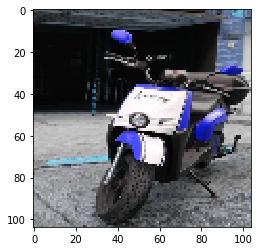

Valor real:
acciona
Valor predecido:
muving
Imagen predecida erroneamente:


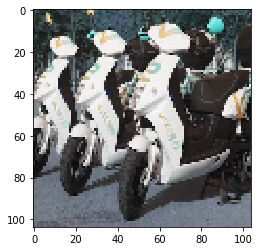

Valor real:
eccoltra
Valor predecido:
blinkee
Imagen predecida erroneamente:


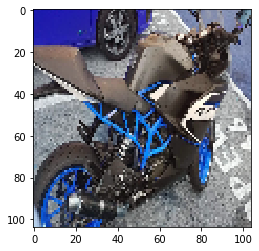

Valor real:
motos
Valor predecido:
yego
Imagen predecida erroneamente:


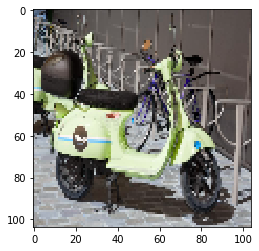

Valor real:
yego
Valor predecido:
blinkee
Imagen predecida erroneamente:


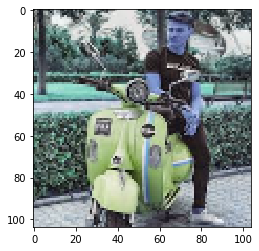

Valor real:
yego
Valor predecido:
blinkee
Imagen predecida erroneamente:


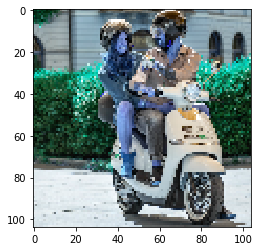

Valor real:
blinkee
Valor predecido:
muving
Imagen predecida erroneamente:


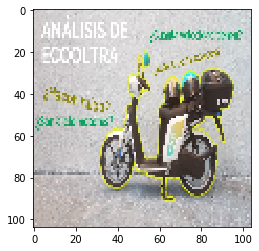

Valor real:
eccoltra
Valor predecido:
muving


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)

#### Datos balanceados nivel alto

In [0]:
CNN = cargar_CNN(CNN_name, base_datos_nombre, pick_name_high_bal  )

544/544 [==============================] - 9s 16ms/step
loss 2.180546150488012
acuracy 0.5496323529411765 
Imagen predecida erroneamente:


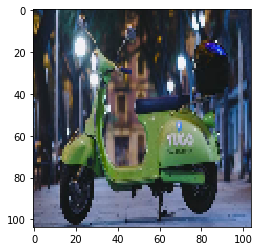

Valor real:
yego
Valor predecido:
muving
Imagen predecida erroneamente:


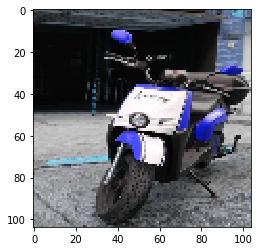

Valor real:
acciona
Valor predecido:
muving
Imagen predecida erroneamente:


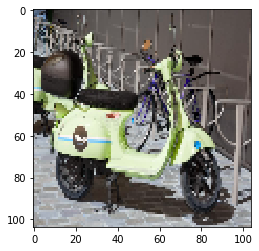

Valor real:
yego
Valor predecido:
blinkee
Imagen predecida erroneamente:


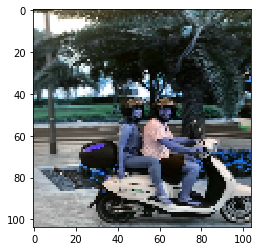

Valor real:
blinkee
Valor predecido:
muving
Imagen predecida erroneamente:


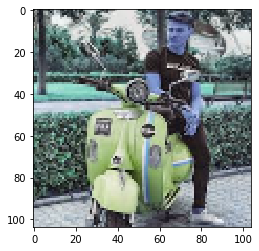

Valor real:
yego
Valor predecido:
blinkee
Imagen predecida erroneamente:


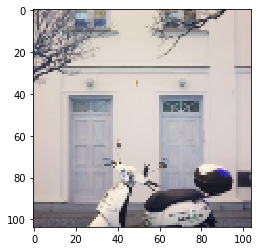

Valor real:
blinkee
Valor predecido:
acciona
Imagen predecida erroneamente:


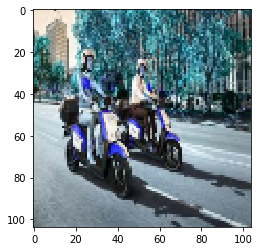

Valor real:
acciona
Valor predecido:
yego


True

In [0]:
Test_CNN(X,y,X_mostrar,y_mostrar,CNN)